In [1]:
import pandas as pd
from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet
from statsmodels.tools.eval_measures import rmse
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
from prophet.serialize import model_to_json, model_from_json

import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

df = pd.read_csv('D:\Download( Chrome)\ELEC0088_Assignment-main\LSTM/london_weather.csv')
# print(df.info())
df.dropna(inplace= True)
# df.reset_index(drop=True, inplace=True)
# print(df.info())

In [2]:
# print(df.tail())
df = df.rename(columns={'mean_temp': 'y', 'date':'ds'})
df['ds'] = pd.to_datetime(df['ds'], format='%Y%m%d')
# print(df.tail())

In [3]:
df.sort_values(by='ds', inplace = True)
df.reset_index(drop=True, inplace=True)
# print(df.head())
# print(df.tail())

13843


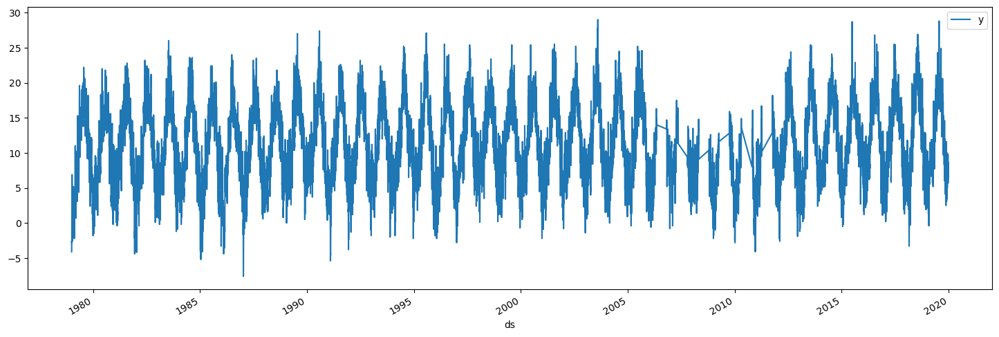

In [4]:
df.plot(x='ds',y='y',figsize=(18,6))
print(len(df))

In [5]:
Test_split = round(len(df)*0.2)
train = df.iloc[:len(df)-Test_split]
test = df.iloc[len(df)-Test_split:]

print(len(train))
print(len(test))

print(test.head())

11074
2769
              ds  cloud_cover  sunshine  global_radiation  max_temp     y  \
11074 2012-05-25          0.0      13.9             323.0      25.9  21.1   
11075 2012-05-26          0.0      14.3             329.0      27.6  20.1   
11076 2012-05-27          0.0      14.1             327.0      26.3  20.7   
11077 2012-05-28          1.0      11.9             299.0      23.8  20.0   
11078 2012-05-29          1.0       8.9             259.0      25.4  19.1   

       min_temp  precipitation  pressure  snow_depth  
11074      16.2            0.0  102320.0         0.0  
11075      14.3            0.0  102010.0         0.0  
11076      13.8            0.0  101840.0         0.0  
11077      13.6            0.0  101780.0         0.0  
11078      14.4            0.0  101740.0         0.0  


In [6]:
def extra_regressor_forecast (multi_var,periods):
    t = train[['ds',multi_var]]
    t = t.rename(columns={multi_var: 'y', 'date':'ds'})
    model = Prophet()
    model.fit(t)
    future = model.make_future_dataframe(periods=periods)
    forecast = model.predict(future)
    return forecast['yhat']

def cross_valid_check(train, df_p):
    best_feature = None
    lowest = df_p.iloc[-1]['mape']
    for column in train.loc[:, ~train.columns.isin(['ds', 'y'])].columns:
        m_cross_valid = Prophet()
        m_cross_valid.add_regressor(column)
        m_cross_valid.fit(train)
        print('Cross validating model with dataset: '+ column)
        
        df_cv_cross_valid = cross_validation(m_cross_valid, initial='10000 days', period='180 days', horizon = '365 days')
        df_p_cross_valid = performance_metrics(df_cv_cross_valid)
        if df_p_cross_valid.iloc[-1]['mape'] < lowest:
            print(lowest ,df_p_cross_valid.iloc[-1]['mape'])
            lowest = df_p_cross_valid.iloc[-1]['mape']
            print(column+' is better')
            best_feature = column
    print('\n')
    return best_feature

03:45:03 - cmdstanpy - INFO - Chain [1] start processing
03:45:07 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/11 [00:00<?, ?it/s]

03:45:08 - cmdstanpy - INFO - Chain [1] start processing
03:45:11 - cmdstanpy - INFO - Chain [1] done processing
03:45:12 - cmdstanpy - INFO - Chain [1] start processing
03:45:14 - cmdstanpy - INFO - Chain [1] done processing
03:45:15 - cmdstanpy - INFO - Chain [1] start processing
03:45:18 - cmdstanpy - INFO - Chain [1] done processing
03:45:19 - cmdstanpy - INFO - Chain [1] start processing
03:45:21 - cmdstanpy - INFO - Chain [1] done processing
03:45:22 - cmdstanpy - INFO - Chain [1] start processing
03:45:26 - cmdstanpy - INFO - Chain [1] done processing
03:45:27 - cmdstanpy - INFO - Chain [1] start processing
03:45:30 - cmdstanpy - INFO - Chain [1] done processing
03:45:31 - cmdstanpy - INFO - Chain [1] start processing
03:45:34 - cmdstanpy - INFO - Chain [1] done processing
03:45:35 - cmdstanpy - INFO - Chain [1] start processing
03:45:38 - cmdstanpy - INFO - Chain [1] done processing
03:45:39 - cmdstanpy - INFO - Chain [1] start processing
03:45:41 - cmdstanpy - INFO - Chain [1]

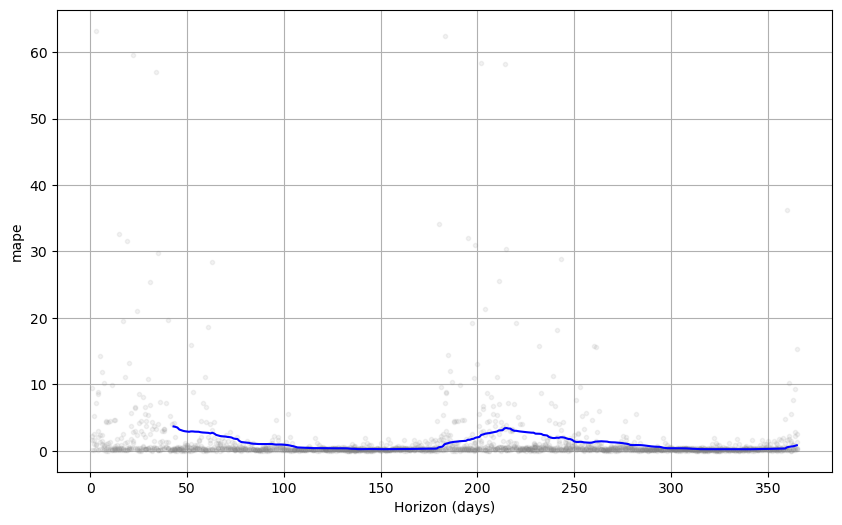

In [7]:
m = Prophet()
m.fit(train)
df_cv = cross_validation(m, initial='10000 days', period='180 days', horizon = '365 days')
df_p = performance_metrics(df_cv)
fig = plot_cross_validation_metric(df_cv, metric='mape')

In [8]:
best_feature = cross_valid_check(train, df_p)

03:45:52 - cmdstanpy - INFO - Chain [1] start processing
03:45:55 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: cloud_cover


  0%|          | 0/11 [00:00<?, ?it/s]

03:45:56 - cmdstanpy - INFO - Chain [1] start processing
03:45:59 - cmdstanpy - INFO - Chain [1] done processing
03:46:00 - cmdstanpy - INFO - Chain [1] start processing
03:46:03 - cmdstanpy - INFO - Chain [1] done processing
03:46:04 - cmdstanpy - INFO - Chain [1] start processing
03:46:07 - cmdstanpy - INFO - Chain [1] done processing
03:46:08 - cmdstanpy - INFO - Chain [1] start processing
03:46:11 - cmdstanpy - INFO - Chain [1] done processing
03:46:13 - cmdstanpy - INFO - Chain [1] start processing
03:46:16 - cmdstanpy - INFO - Chain [1] done processing
03:46:17 - cmdstanpy - INFO - Chain [1] start processing
03:46:20 - cmdstanpy - INFO - Chain [1] done processing
03:46:22 - cmdstanpy - INFO - Chain [1] start processing
03:46:24 - cmdstanpy - INFO - Chain [1] done processing
03:46:25 - cmdstanpy - INFO - Chain [1] start processing
03:46:28 - cmdstanpy - INFO - Chain [1] done processing
03:46:29 - cmdstanpy - INFO - Chain [1] start processing
03:46:33 - cmdstanpy - INFO - Chain [1]

0.8228701577136851 0.8179177524741056
cloud_cover is better


03:46:43 - cmdstanpy - INFO - Chain [1] start processing
03:46:47 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: sunshine


  0%|          | 0/11 [00:00<?, ?it/s]

03:46:48 - cmdstanpy - INFO - Chain [1] start processing
03:46:52 - cmdstanpy - INFO - Chain [1] done processing
03:46:54 - cmdstanpy - INFO - Chain [1] start processing
03:46:58 - cmdstanpy - INFO - Chain [1] done processing
03:46:59 - cmdstanpy - INFO - Chain [1] start processing
03:47:02 - cmdstanpy - INFO - Chain [1] done processing
03:47:03 - cmdstanpy - INFO - Chain [1] start processing
03:47:06 - cmdstanpy - INFO - Chain [1] done processing
03:47:07 - cmdstanpy - INFO - Chain [1] start processing
03:47:10 - cmdstanpy - INFO - Chain [1] done processing
03:47:11 - cmdstanpy - INFO - Chain [1] start processing
03:47:14 - cmdstanpy - INFO - Chain [1] done processing
03:47:16 - cmdstanpy - INFO - Chain [1] start processing
03:47:19 - cmdstanpy - INFO - Chain [1] done processing
03:47:21 - cmdstanpy - INFO - Chain [1] start processing
03:47:25 - cmdstanpy - INFO - Chain [1] done processing
03:47:27 - cmdstanpy - INFO - Chain [1] start processing
03:47:31 - cmdstanpy - INFO - Chain [1]

Cross validating model with dataset: global_radiation


  0%|          | 0/11 [00:00<?, ?it/s]

03:47:45 - cmdstanpy - INFO - Chain [1] start processing
03:47:49 - cmdstanpy - INFO - Chain [1] done processing
03:47:50 - cmdstanpy - INFO - Chain [1] start processing
03:47:53 - cmdstanpy - INFO - Chain [1] done processing
03:47:55 - cmdstanpy - INFO - Chain [1] start processing
03:47:59 - cmdstanpy - INFO - Chain [1] done processing
03:48:00 - cmdstanpy - INFO - Chain [1] start processing
03:48:03 - cmdstanpy - INFO - Chain [1] done processing
03:48:04 - cmdstanpy - INFO - Chain [1] start processing
03:48:08 - cmdstanpy - INFO - Chain [1] done processing
03:48:10 - cmdstanpy - INFO - Chain [1] start processing
03:48:13 - cmdstanpy - INFO - Chain [1] done processing
03:48:14 - cmdstanpy - INFO - Chain [1] start processing
03:48:18 - cmdstanpy - INFO - Chain [1] done processing
03:48:20 - cmdstanpy - INFO - Chain [1] start processing
03:48:25 - cmdstanpy - INFO - Chain [1] done processing
03:48:28 - cmdstanpy - INFO - Chain [1] start processing
03:48:32 - cmdstanpy - INFO - Chain [1]

Cross validating model with dataset: max_temp


  0%|          | 0/11 [00:00<?, ?it/s]

03:48:50 - cmdstanpy - INFO - Chain [1] start processing
03:48:56 - cmdstanpy - INFO - Chain [1] done processing
03:48:58 - cmdstanpy - INFO - Chain [1] start processing
03:49:02 - cmdstanpy - INFO - Chain [1] done processing
03:49:06 - cmdstanpy - INFO - Chain [1] start processing
03:49:13 - cmdstanpy - INFO - Chain [1] done processing
03:49:18 - cmdstanpy - INFO - Chain [1] start processing
03:49:22 - cmdstanpy - INFO - Chain [1] done processing
03:49:25 - cmdstanpy - INFO - Chain [1] start processing
03:49:29 - cmdstanpy - INFO - Chain [1] done processing
03:49:30 - cmdstanpy - INFO - Chain [1] start processing
03:49:33 - cmdstanpy - INFO - Chain [1] done processing
03:49:34 - cmdstanpy - INFO - Chain [1] start processing
03:49:40 - cmdstanpy - INFO - Chain [1] done processing
03:49:42 - cmdstanpy - INFO - Chain [1] start processing
03:49:45 - cmdstanpy - INFO - Chain [1] done processing
03:49:46 - cmdstanpy - INFO - Chain [1] start processing
03:49:51 - cmdstanpy - INFO - Chain [1]

0.8179177524741056 0.3790692203449553
max_temp is better


03:50:03 - cmdstanpy - INFO - Chain [1] start processing
03:50:10 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: min_temp


  0%|          | 0/11 [00:00<?, ?it/s]

03:50:12 - cmdstanpy - INFO - Chain [1] start processing
03:50:17 - cmdstanpy - INFO - Chain [1] done processing
03:50:18 - cmdstanpy - INFO - Chain [1] start processing
03:50:22 - cmdstanpy - INFO - Chain [1] done processing
03:50:24 - cmdstanpy - INFO - Chain [1] start processing
03:50:30 - cmdstanpy - INFO - Chain [1] done processing
03:50:32 - cmdstanpy - INFO - Chain [1] start processing
03:50:37 - cmdstanpy - INFO - Chain [1] done processing
03:50:38 - cmdstanpy - INFO - Chain [1] start processing
03:50:44 - cmdstanpy - INFO - Chain [1] done processing
03:50:46 - cmdstanpy - INFO - Chain [1] start processing
03:50:50 - cmdstanpy - INFO - Chain [1] done processing
03:50:52 - cmdstanpy - INFO - Chain [1] start processing
03:50:59 - cmdstanpy - INFO - Chain [1] done processing
03:51:00 - cmdstanpy - INFO - Chain [1] start processing
03:51:06 - cmdstanpy - INFO - Chain [1] done processing
03:51:08 - cmdstanpy - INFO - Chain [1] start processing
03:51:12 - cmdstanpy - INFO - Chain [1]

0.3790692203449553 0.25539111870262754
min_temp is better


03:51:27 - cmdstanpy - INFO - Chain [1] start processing
03:51:34 - cmdstanpy - INFO - Chain [1] done processing


Cross validating model with dataset: precipitation


  0%|          | 0/11 [00:00<?, ?it/s]

03:51:35 - cmdstanpy - INFO - Chain [1] start processing
03:51:39 - cmdstanpy - INFO - Chain [1] done processing
03:51:41 - cmdstanpy - INFO - Chain [1] start processing
03:51:44 - cmdstanpy - INFO - Chain [1] done processing
03:51:46 - cmdstanpy - INFO - Chain [1] start processing
03:51:49 - cmdstanpy - INFO - Chain [1] done processing
03:51:51 - cmdstanpy - INFO - Chain [1] start processing
03:51:54 - cmdstanpy - INFO - Chain [1] done processing
03:51:55 - cmdstanpy - INFO - Chain [1] start processing
03:51:58 - cmdstanpy - INFO - Chain [1] done processing
03:51:59 - cmdstanpy - INFO - Chain [1] start processing
03:52:04 - cmdstanpy - INFO - Chain [1] done processing
03:52:06 - cmdstanpy - INFO - Chain [1] start processing
03:52:10 - cmdstanpy - INFO - Chain [1] done processing
03:52:12 - cmdstanpy - INFO - Chain [1] start processing
03:52:19 - cmdstanpy - INFO - Chain [1] done processing
03:52:22 - cmdstanpy - INFO - Chain [1] start processing
03:52:26 - cmdstanpy - INFO - Chain [1]

Cross validating model with dataset: pressure


  0%|          | 0/11 [00:00<?, ?it/s]

03:52:52 - cmdstanpy - INFO - Chain [1] start processing
03:52:56 - cmdstanpy - INFO - Chain [1] done processing
03:52:58 - cmdstanpy - INFO - Chain [1] start processing
03:53:01 - cmdstanpy - INFO - Chain [1] done processing
03:53:02 - cmdstanpy - INFO - Chain [1] start processing
03:53:07 - cmdstanpy - INFO - Chain [1] done processing
03:53:08 - cmdstanpy - INFO - Chain [1] start processing
03:53:11 - cmdstanpy - INFO - Chain [1] done processing
03:53:12 - cmdstanpy - INFO - Chain [1] start processing
03:53:15 - cmdstanpy - INFO - Chain [1] done processing
03:53:16 - cmdstanpy - INFO - Chain [1] start processing
03:53:19 - cmdstanpy - INFO - Chain [1] done processing
03:53:20 - cmdstanpy - INFO - Chain [1] start processing
03:53:25 - cmdstanpy - INFO - Chain [1] done processing
03:53:26 - cmdstanpy - INFO - Chain [1] start processing
03:53:28 - cmdstanpy - INFO - Chain [1] done processing
03:53:31 - cmdstanpy - INFO - Chain [1] start processing
03:53:35 - cmdstanpy - INFO - Chain [1]

Cross validating model with dataset: snow_depth


  0%|          | 0/11 [00:00<?, ?it/s]

03:53:54 - cmdstanpy - INFO - Chain [1] start processing
03:53:59 - cmdstanpy - INFO - Chain [1] done processing
03:54:00 - cmdstanpy - INFO - Chain [1] start processing
03:54:03 - cmdstanpy - INFO - Chain [1] done processing
03:54:04 - cmdstanpy - INFO - Chain [1] start processing
03:54:08 - cmdstanpy - INFO - Chain [1] done processing
03:54:09 - cmdstanpy - INFO - Chain [1] start processing
03:54:12 - cmdstanpy - INFO - Chain [1] done processing
03:54:14 - cmdstanpy - INFO - Chain [1] start processing
03:54:17 - cmdstanpy - INFO - Chain [1] done processing
03:54:18 - cmdstanpy - INFO - Chain [1] start processing
03:54:22 - cmdstanpy - INFO - Chain [1] done processing
03:54:23 - cmdstanpy - INFO - Chain [1] start processing
03:54:27 - cmdstanpy - INFO - Chain [1] done processing
03:54:29 - cmdstanpy - INFO - Chain [1] start processing
03:54:31 - cmdstanpy - INFO - Chain [1] done processing
03:54:32 - cmdstanpy - INFO - Chain [1] start processing
03:54:38 - cmdstanpy - INFO - Chain [1]

In [9]:
periods = len(test)+365*5
m = Prophet()
m.add_regressor(str(best_feature))
print(best_feature +' added to the model')
m.fit(train)
future = m.make_future_dataframe(periods=periods)
future[best_feature] = extra_regressor_forecast(best_feature,periods)
print (best_feature+ ' predicted ')
forecast = m.predict(future)
print('Forecasting the mean temperature')

min_temp added to the model


03:54:54 - cmdstanpy - INFO - Chain [1] start processing
03:55:02 - cmdstanpy - INFO - Chain [1] done processing
03:55:04 - cmdstanpy - INFO - Chain [1] start processing
03:55:09 - cmdstanpy - INFO - Chain [1] done processing


min_temp predicted 
Forecasting the mean temperature


In [10]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
15663,2024-12-17,5.138318,2.218703,8.163453
15664,2024-12-18,5.153721,2.361286,8.213329
15665,2024-12-19,5.091847,2.062250,8.128235
15666,2024-12-20,5.015501,2.179341,8.058216
15667,2024-12-21,4.928422,1.851645,8.163499


In [11]:
plot_plotly(m ,forecast)

In [12]:
plot_components_plotly(m, forecast)

In [13]:
predictions = forecast.iloc[len(train):len(train)+len(test)]['yhat']
print("Root Mean Squared Error between actual and  predicted values: ",rmse(predictions,test['y']))
print("Mean Value of Test Dataset:", test['y'].mean())

Root Mean Squared Error between actual and  predicted values:  2.93917881369492
Mean Value of Test Dataset: 12.189779703864216


In [14]:
training = forecast.iloc[:len(train)]['yhat']
print("Root Mean Squared Error between actual and  predicted values: ",rmse(training,train['y']))

Root Mean Squared Error between actual and  predicted values:  2.8844214873524034


In [15]:
# with open('model_multi_prophet_weather_cross_validation_model.json', 'w') as fout:
#     fout.write(model_to_json(m))

In [16]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].to_csv('Prophet weather forecast_3.csv')